In [1]:
import cv2
import matplotlib.pyplot as plt

In [2]:
img=cv2.imread("raw_captures/low1.jpeg")

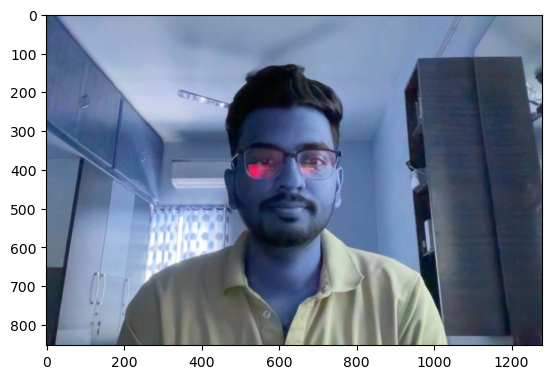

In [3]:
plt.imshow(img)

In [4]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


In [5]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


In [6]:
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

In [7]:
h,s,v=cv2.split(hsv)


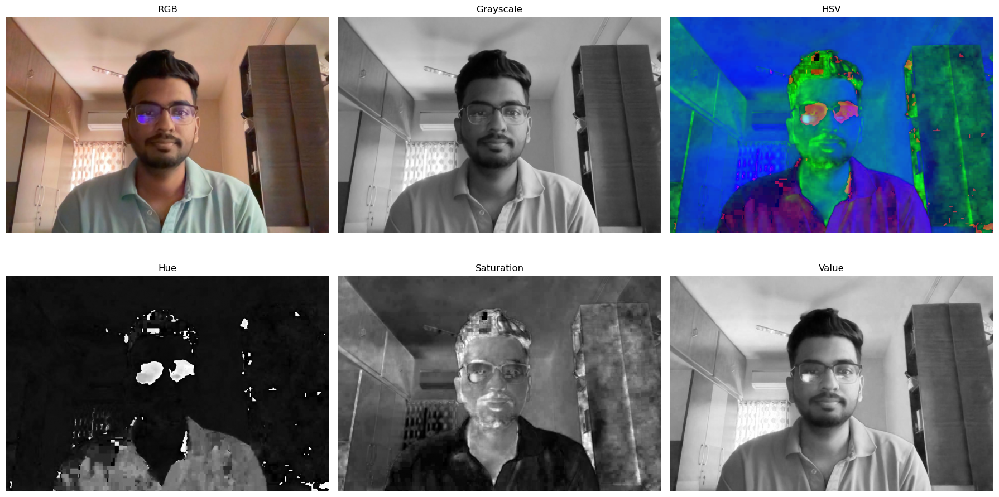

In [8]:
plt.figure(figsize=(18,10))

plt.subplot(2,3,1)
plt.imshow(img_rgb)
plt.title("RGB")
plt.axis("off")

plt.subplot(2,3,2)
plt.imshow(gray, cmap="gray")
plt.title("Grayscale")
plt.axis("off")

plt.subplot(2,3,3)
plt.imshow(hsv, cmap="gray")
plt.title("HSV")
plt.axis("off")

plt.subplot(2,3,4)
plt.imshow(h, cmap="gray")
plt.title("Hue")
plt.axis("off")

plt.subplot(2,3,5)
plt.imshow(s, cmap="gray")
plt.title("Saturation")
plt.axis("off")

plt.subplot(2,3,6)
plt.imshow(v, cmap="gray")
plt.title("Value")
plt.axis("off")
plt.tight_layout()
plt.show()

The image was converted into RGB, Grayscale, and HSV color spaces. The HSV image was further split into Hue (H), Saturation (S), and Value (V) channels. The Value (V) channel preserved the most details in the darker regions because it represents the brightness of each pixel. The Hue (H) channel contains only color information and loses detail in poorly lit areas. The Saturation (S) channel highlights the intensity of colors but does not preserve brightness details effectively. Therefore, for this low-light image, the Value channel is the most useful for analyzing objects in dark regions.

# Task2 Image Blending via Feature Matching

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [10]:
img1 = cv2.imread("raw_captures/bright1.jpeg")
img2 = cv2.imread("raw_captures/low1.jpeg")

In [11]:
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

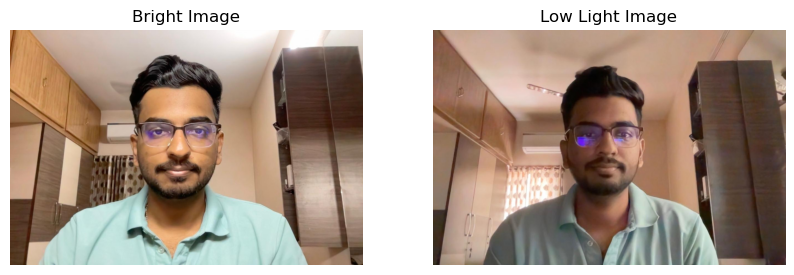

In [12]:
plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow(img1_rgb)
plt.title("Bright Image")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(img2_rgb)
plt.title("Low Light Image")
plt.axis("off")

plt.show()

ORB Feauture detection

In [13]:
orb = cv2.ORB_create()
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)


In [14]:
img1_key = cv2.drawKeypoints(img1_rgb,kp1,None,color=(0,255,0))
img2_key = cv2.drawKeypoints(img2_rgb,kp2,None,color=(0,255,0))

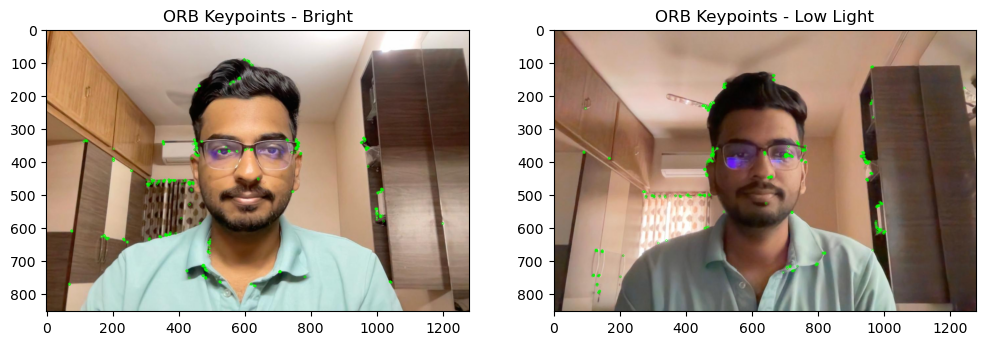

In [15]:
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(img1_key)
plt.title("ORB Keypoints - Bright")

plt.subplot(1,2,2)
plt.imshow(img2_key)
plt.title("ORB Keypoints - Low Light")

plt.show()

Brute Force Matching

In [16]:
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

Homography Estimation using RANSAC

In [17]:
matched_img = cv2.drawMatches(
    img1_rgb,
    kp1,
    img2_rgb,
    kp2,
    matches[:50],
    None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

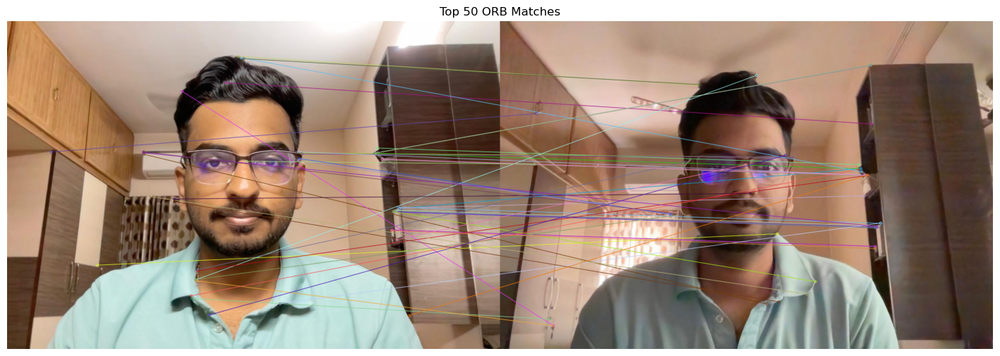

In [18]:
plt.figure(figsize=(18,8))
plt.imshow(matched_img)
plt.title("Top 50 ORB Matches")
plt.axis("off")
plt.show()

In [19]:
print("Total Matches:", len(matches))

Total Matches: 129


In [20]:
src_pts = np.float32(
    [kp1[m.queryIdx].pt for m in matches]
).reshape(-1,1,2)

dst_pts = np.float32(
    [kp2[m.trainIdx].pt for m in matches]
).reshape(-1,1,2)

In [21]:
H, mask = cv2.findHomography(dst_pts,src_pts,cv2.RANSAC,5.0)
print("Homography Matrix:\n")
print(H)

Homography Matrix:

[[ 1.56883935e+00 -2.60133433e-01 -2.15276777e+02]
 [ 3.20860015e-01  1.02101132e+00 -2.81911469e+02]
 [ 3.09831839e-04 -2.42517558e-04  1.00000000e+00]]


In [22]:
good_matches = np.sum(mask)
print("Good Matches after RANSAC:", good_matches)

Good Matches after RANSAC: 18


Perspective warping

In [23]:
height, width = img1.shape[:2]
warped = cv2.warpPerspective(img2,H,(width, height))

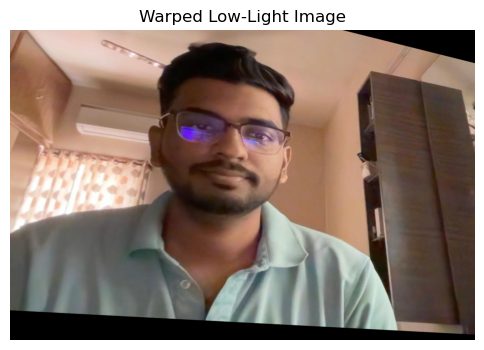

In [24]:
warped_rgb = cv2.cvtColor(warped, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(6,6))
plt.imshow(warped_rgb)
plt.title("Warped Low-Light Image")
plt.axis("off")
plt.show()

In [25]:
blended = cv2.addWeighted(img1,0.5,warped,0.5,0)

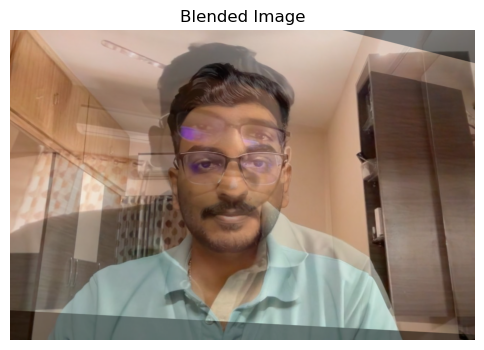

In [26]:
blended_rgb = cv2.cvtColor(blended, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(6,6))
plt.imshow(blended_rgb)
plt.title("Blended Image")
plt.axis("off")
plt.show()

In [27]:
blend1 = cv2.addWeighted(img1, 0.7, warped, 0.3, 0)
blend2 = cv2.addWeighted(img1, 0.3, warped, 0.7, 0)

In [28]:
blended_rgb1 = cv2.cvtColor(blend1, cv2.COLOR_BGR2RGB)
blended_rgb2 = cv2.cvtColor(blend2, cv2.COLOR_BGR2RGB)

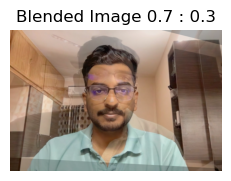

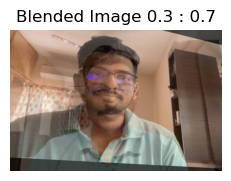

In [29]:
plt.figure(figsize=(6,6))
plt.subplot(1,2,1)
plt.imshow(blended_rgb1)
plt.title("Blended Image 0.7 : 0.3")
plt.axis("off")

plt.figure(figsize=(6,6))
plt.subplot(1,2,2)
plt.imshow(blended_rgb2)
plt.title("Blended Image 0.3 : 0.7")
plt.axis("off")

plt.show()

# Task 3 – Geometric Transformations

### Reference Values

- Reference Number: **55**
- Rotation Angle: **165°**
- Scale Factor: **1.5**

Translation

In [30]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread("raw_captures/object1.jpeg")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

height, width = img.shape[:2]

In [31]:
tx = 100
ty = 50

translation_matrix = np.float32([
    [1, 0, tx],
    [0, 1, ty]
])

translated = cv2.warpAffine(
    img_rgb,
    translation_matrix,
    (width, height)
)

Rotation

In [32]:
center = (width // 2, height // 2)

In [33]:
rotation_matrix = cv2.getRotationMatrix2D(
    center,
    165,
    1.5
)
rotated = cv2.warpAffine(
    img_rgb,
    rotation_matrix,
    (width, height)
)

Scaling

In [34]:
scaled = cv2.resize(img_rgb,None,fx=1.5,fy=1.5,interpolation=cv2.INTER_LINEAR)

Affine Transformation

In [35]:
rows, cols = img_rgb.shape[:2]

pts1 = np.float32([
    [50, 50],
    [200, 50],
    [50, 200]
])

pts2 = np.float32([
    [80, 80],
    [220, 60],
    [70, 250]
])
affine_matrix = cv2.getAffineTransform(pts1, pts2)
affine = cv2.warpAffine(
    img_rgb,
    affine_matrix,
    (cols, rows)
)

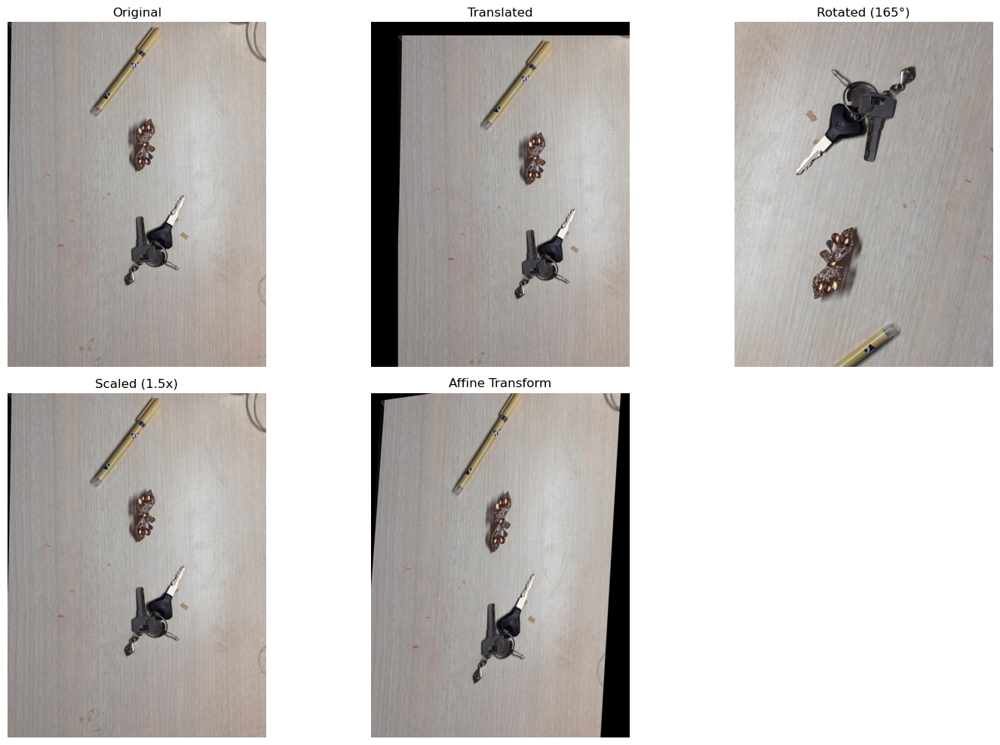

In [36]:
plt.figure(figsize=(15,10))

plt.subplot(2,3,1)
plt.imshow(img_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(2,3,2)
plt.imshow(translated)
plt.title("Translated")
plt.axis("off")

plt.subplot(2,3,3)
plt.imshow(rotated)
plt.title("Rotated (165°)")
plt.axis("off")

plt.subplot(2,3,4)
plt.imshow(scaled)
plt.title("Scaled (1.5x)")
plt.axis("off")

plt.subplot(2,3,5)
plt.imshow(affine)
plt.title("Affine Transform")
plt.axis("off")

plt.tight_layout()
plt.show()

# Task 4 – Noise and Filtering

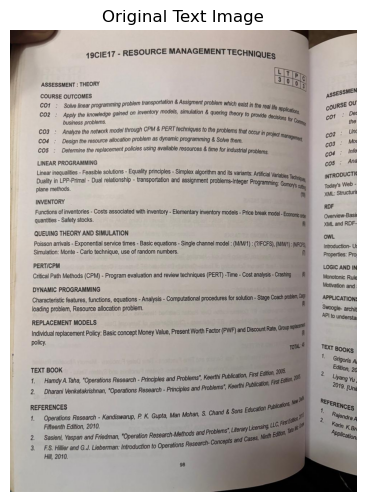

In [37]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread("raw_captures/text1.jpeg")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(6,6))
plt.imshow(img_rgb)
plt.title("Original Text Image")
plt.axis("off")
plt.show()

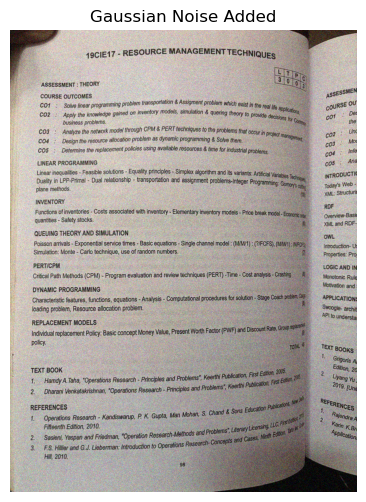

In [38]:
mean = 0
sigma = 25

noise = np.random.normal(mean, sigma, img.shape).astype(np.float32)

noisy = img.astype(np.float32) + noise
noisy = np.clip(noisy, 0, 255).astype(np.uint8)

noisy_rgb = cv2.cvtColor(noisy, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(6,6))
plt.imshow(noisy_rgb)
plt.title("Gaussian Noise Added")
plt.axis("off")
plt.show()

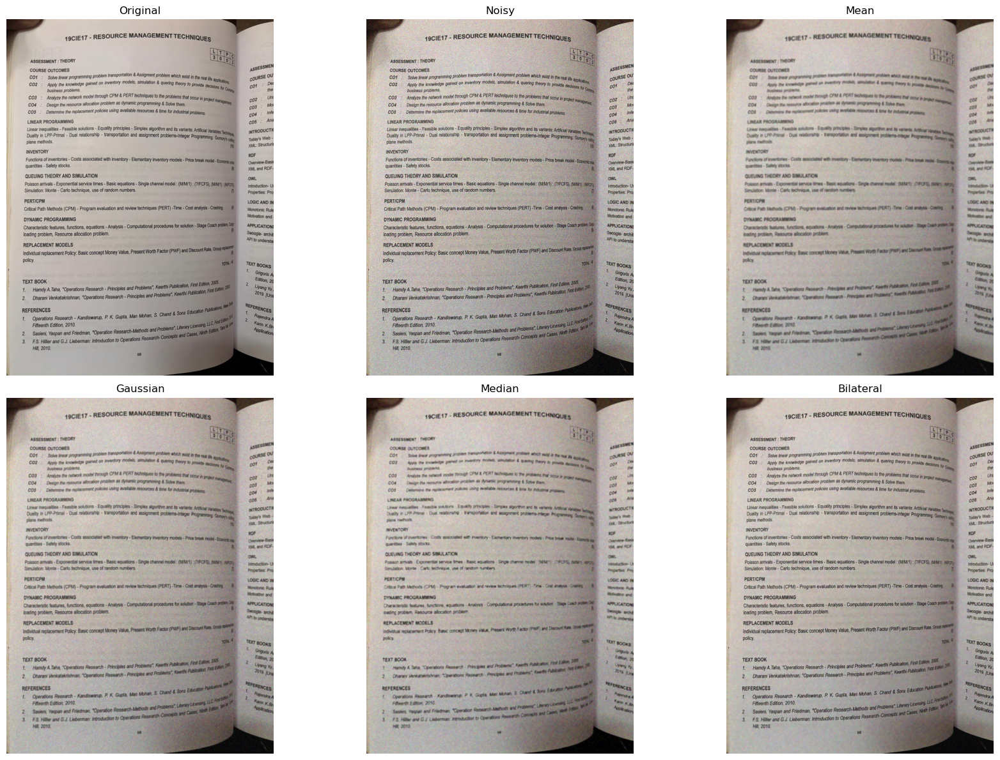

In [39]:
mean_filter = cv2.blur(noisy, (5,5))
gaussian_filter = cv2.GaussianBlur(noisy, (5,5), 0)
median_filter = cv2.medianBlur(noisy, 5)
bilateral_filter = cv2.bilateralFilter(
    noisy,
    d=9,
    sigmaColor=75,
    sigmaSpace=75
)
images = [
    img_rgb,
    noisy_rgb,
    cv2.cvtColor(mean_filter, cv2.COLOR_BGR2RGB),
    cv2.cvtColor(gaussian_filter, cv2.COLOR_BGR2RGB),
    cv2.cvtColor(median_filter, cv2.COLOR_BGR2RGB),
    cv2.cvtColor(bilateral_filter, cv2.COLOR_BGR2RGB)
]

titles = [
    "Original",
    "Noisy",
    "Mean",
    "Gaussian",
    "Median",
    "Bilateral"
]

plt.figure(figsize=(18, 12))

for i in range(6):
    plt.subplot(2,3,i+1)
    plt.imshow(images[i])
    plt.title(titles[i])
    plt.axis("off")

plt.tight_layout()
plt.show()

## Observation

### Prediction
I predicted that the Bilateral Filter would preserve the text edges best because it reduces noise while maintaining sharp edges.

### Comparison

- **Mean Filter:** Reduced the Gaussian noise but blurred the text significantly, making small characters less clear.
- **Gaussian Filter:** Reduced Gaussian noise effectively and produced a smoother image, but slightly blurred the text edges.
- **Median Filter:** Preserved text edges better than the Mean and Gaussian filters, but it was less effective at removing Gaussian noise because it is mainly designed for salt-and-pepper noise.
- **Bilateral Filter:** Reduced the noise while preserving the text edges, producing the clearest and most readable result among all four filters.

### Conclusion

My prediction was correct. The Bilateral Filter provided the best balance between noise reduction and edge preservation, making it the most suitable filter for this noisy text image.

# Task 5 – Edge and Contour Detection


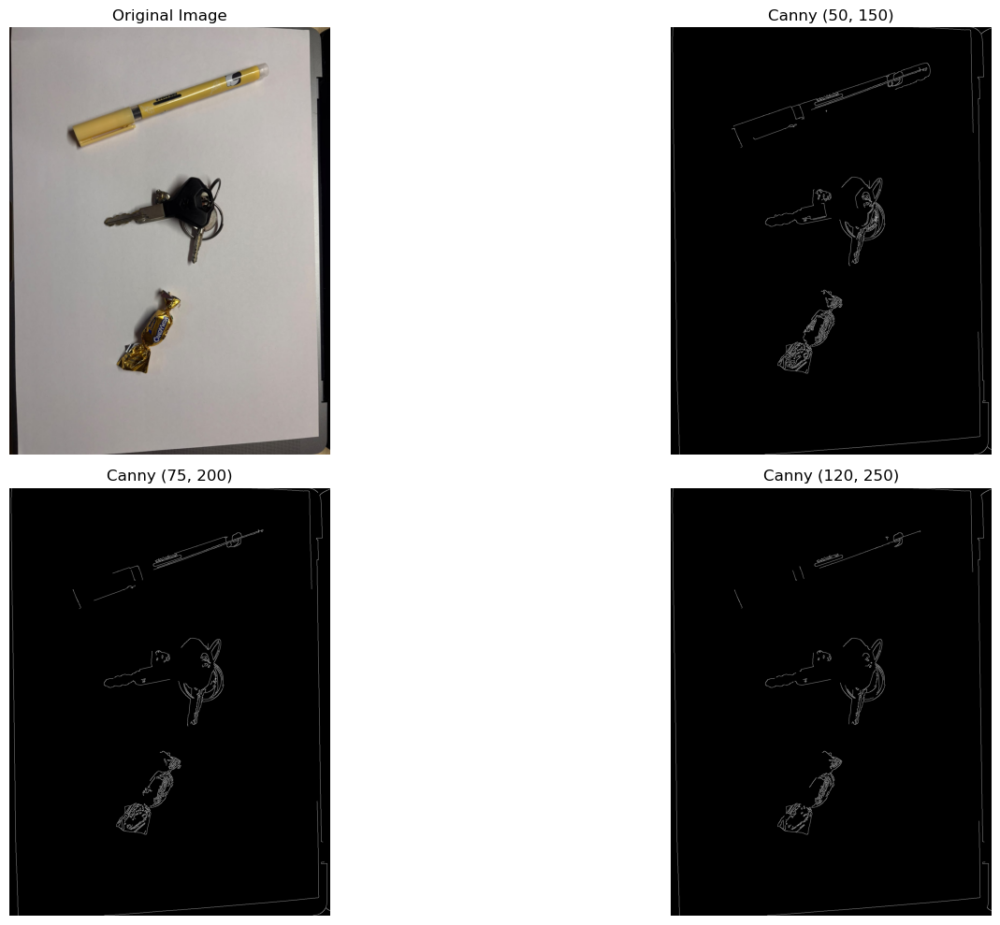

In [40]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image
img = cv2.imread("raw_captures/object2.jpeg")

# Convert to RGB for displaying
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Convert to Grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply Gaussian Blur before Canny
blur = cv2.GaussianBlur(gray, (5, 5), 0)

# Apply Canny Edge Detection with different thresholds
try1 = cv2.Canny(blur, 50, 150)
try2 = cv2.Canny(blur, 75, 200)
try3 = cv2.Canny(blur, 120, 250)

# Display the results
plt.figure(figsize=(18, 10))

plt.subplot(2, 2, 1)
plt.imshow(img_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(try1, cmap="gray")
plt.title("Canny (50, 150)")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(try2, cmap="gray")
plt.title("Canny (75, 200)")
plt.axis("off")

plt.subplot(2, 2, 4)
plt.imshow(try3, cmap="gray")
plt.title("Canny (120, 250)")
plt.axis("off")

plt.tight_layout()
plt.show()

Contours Detected : 4


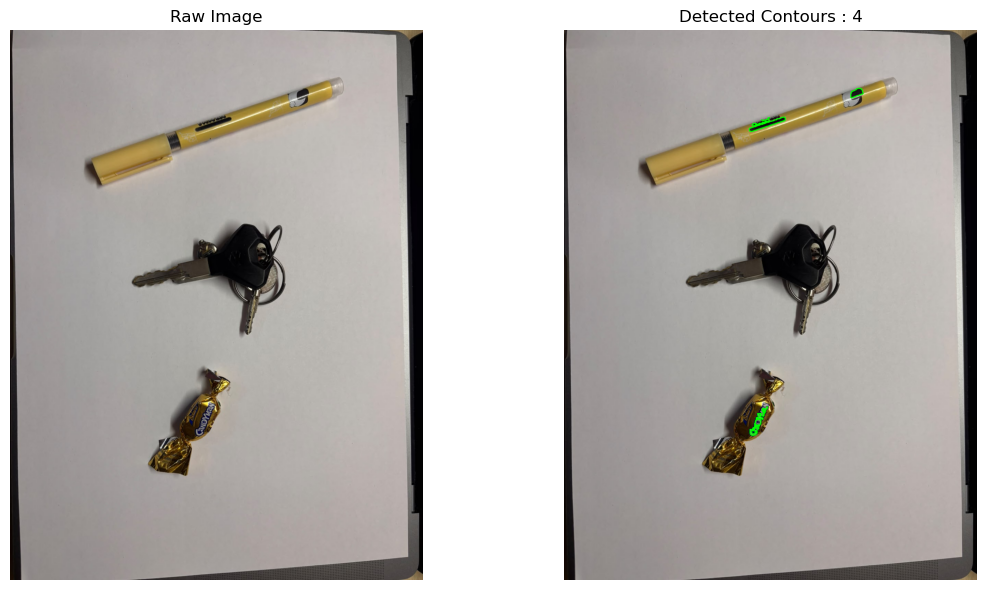

In [41]:
edges3 = cv2.Canny(blur, 120, 250)
contours, _ = cv2.findContours(
    edges3,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE
)

filtered = []

for cnt in contours:

    area = cv2.contourArea(cnt)

    # Ignore tiny noisy contours
    if area > 150:
        filtered.append(cnt)

output = img_rgb.copy()

cv2.drawContours(
    output,
    filtered,
    -1,
    (0,255,0),
    2
)

print("Contours Detected :", len(filtered))

plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(img_rgb)
plt.title("Raw Image")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(output)
plt.title(f"Detected Contours : {len(filtered)}")
plt.axis("off")

plt.tight_layout()
plt.show()

Observation

Actual objects placed: 3 (Pen, Keys, Candy)
Detected contours: 4

Initially, Canny thresholds (50,150) produced broken object edges. After experimenting with different threshold values, the final thresholds (120,250) provided the best object boundaries.

Although only three objects were placed, four contours were detected. This occurred because the pen was detected as multiple contour segments due to its clip and printed markings, while shadows and reflections around the objects created additional edge regions.

This demonstrates that contour-based object detection is sensitive to object shape, lighting conditions, and image reflections.

# Task 6. Thresholding and Morphology

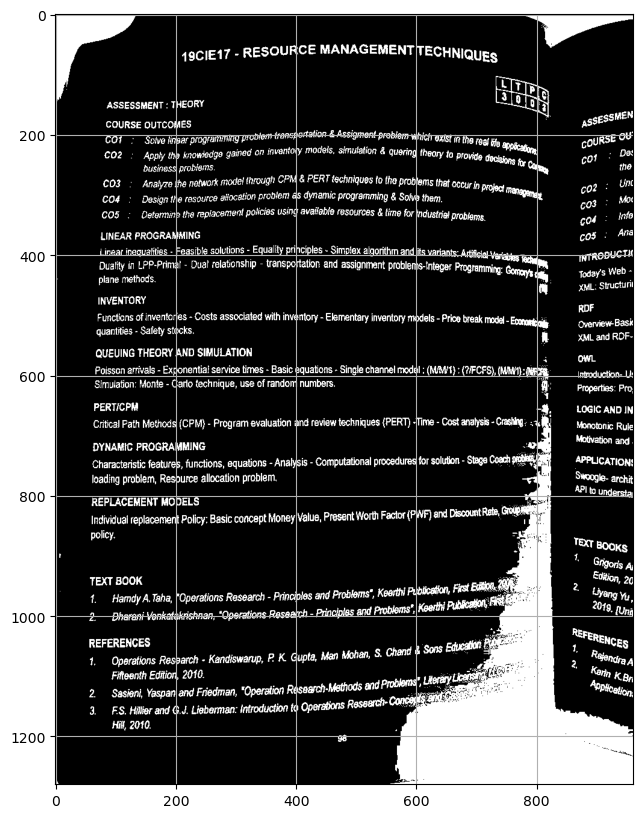

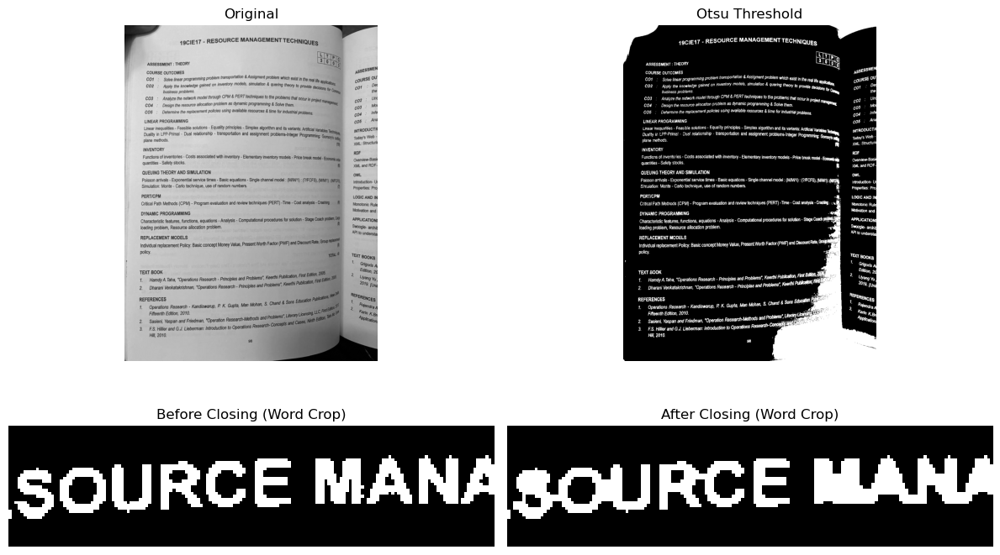

In [42]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the text page image
img = cv2.imread("raw_captures/text1.jpeg")      # Replace with your image name
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Otsu Thresholding
_, otsu = cv2.threshold(
    gray,
    0,
    255,
    cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
)

# Morphological Closing
kernel = np.ones((3,3), np.uint8)
closed = cv2.morphologyEx(
    otsu,
    cv2.MORPH_CLOSE,
    kernel
)

# Crop one word (adjust coordinates if needed)
crop_before = otsu[40:80, 340:500]
crop_after  = closed[40:80, 340:500]
plt.figure(figsize=(8,10))
plt.imshow(otsu, cmap="gray")
plt.grid()
plt.show()

# Display Results
plt.figure(figsize=(12,8))

plt.subplot(2,2,1)
plt.imshow(gray, cmap="gray")
plt.title("Original")
plt.axis("off")

plt.subplot(2,2,2)
plt.imshow(otsu, cmap="gray")
plt.title("Otsu Threshold")
plt.axis("off")

plt.subplot(2,2,3)
plt.imshow(crop_before, cmap="gray")
plt.title("Before Closing (Word Crop)")
plt.axis("off")

plt.subplot(2,2,4)
plt.imshow(crop_after, cmap="gray")
plt.title("After Closing (Word Crop)")
plt.axis("off")

plt.tight_layout()
plt.show()

Kernel Size Used: 3 × 3
A 3×3 kernel produced the best result by filling small gaps in the characters while preserving their shape. A smaller kernel (2×2) did not effectively connect broken pixels, whereas a larger kernel (5×5) caused adjacent letters to merge due to the image resolution and font size.

# Task 7  Feature Matching Across Photos  

In [43]:
import cv2
import matplotlib.pyplot as plt

img1 = cv2.imread("raw_captures/object1.jpeg")   
img2 = cv2.imread("raw_captures/object3.jpeg")   

gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)


Total Matches: 267
Good Matches: 31


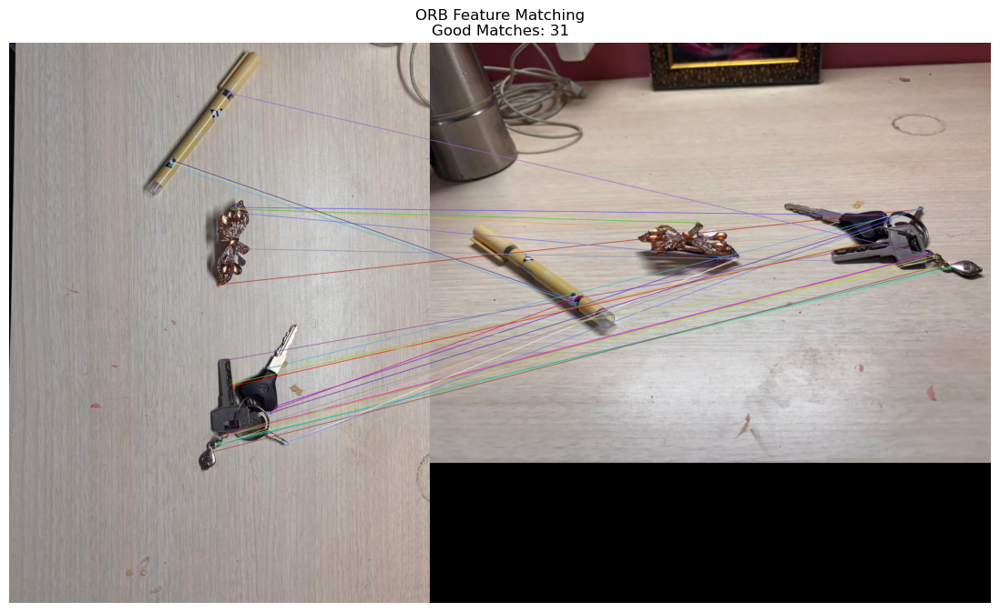

In [44]:

# Create ORB detector
orb = cv2.ORB_create(nfeatures=1000)

# Detect keypoints and descriptors
kp1, des1 = orb.detectAndCompute(gray1, None)
kp2, des2 = orb.detectAndCompute(gray2, None)

# Brute Force Matcher
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Match descriptors
matches = bf.match(des1, des2)

# Sort matches by distance
matches = sorted(matches, key=lambda x: x.distance)

# Keep only good matches
good_matches = [m for m in matches if m.distance < 50]

print("Total Matches:", len(matches))
print("Good Matches:", len(good_matches))

# Draw first 30 good matches
matched_img = cv2.drawMatches(
    img1, kp1,
    img2, kp2,
    good_matches[:30],
    None,
    flags=2
)

plt.figure(figsize=(16,8))
plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
plt.title(f"ORB Feature Matching\nGood Matches: {len(good_matches)}")
plt.axis("off")
plt.show()

ORB feature matching was performed between two images of the same desk scene captured from different viewing angles. A total of 267 feature matches were found, out of which 31 were classified as good matches after filtering. The keys produced the strongest feature matches because they contain many distinctive corners and edges. The pen also produced several reliable matches due to its textured body and printed markings. ORB was able to match these objects successfully despite the change in viewing angle.

# Task8 Haar Cascade Face Detector

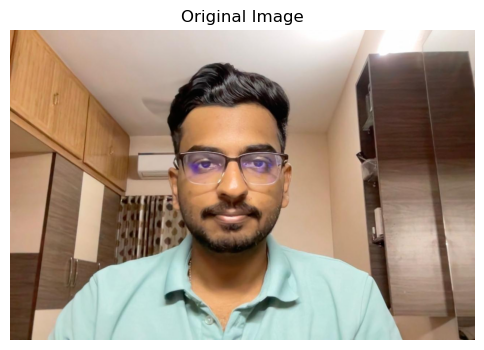

In [45]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread("raw_captures/bright1.jpeg")

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(6,6))
plt.imshow(img_rgb)
plt.title("Original Image")
plt.axis("off")
plt.show()

In [46]:
face_cascade = cv2.CascadeClassifier(
    cv2.data.haarcascades + "haarcascade_frontalface_default.xml"
)
faces = face_cascade.detectMultiScale(
    gray,
    scaleFactor=1.1,
    minNeighbors=5,
    minSize=(40,40)
)

print("Faces Detected:", len(faces))

Faces Detected: 1


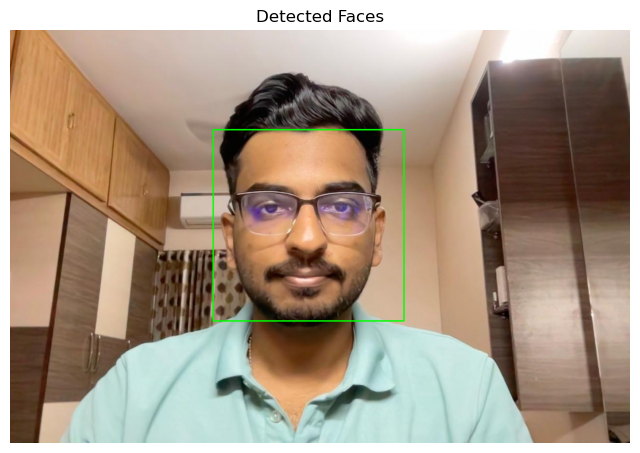

In [47]:
output = img_rgb.copy()

for (x, y, w, h) in faces:
    cv2.rectangle(output, (x, y), (x+w, y+h), (0,255,0), 2)

plt.figure(figsize=(8,8))
plt.imshow(output)
plt.title("Detected Faces")
plt.axis("off")
plt.show()

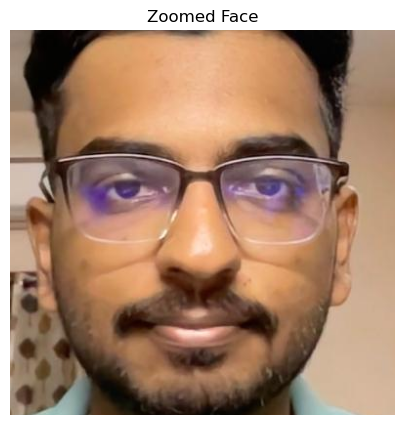

In [48]:
if len(faces) > 0:
    x, y, w, h = faces[0]

    crop = img_rgb[y:y+h, x:x+w]

    plt.figure(figsize=(5,5))
    plt.imshow(crop)
    plt.title("Zoomed Face")
    plt.axis("off")
    plt.show()

The Haar Cascade detector successfully detected the face under normal lighting conditions. The frontal face orientation and sufficient illumination enabled the detector to recognize the facial features accurately.

# Task 9: Real-Time Video Processing

In [49]:
import cv2
video = cv2.VideoCapture("raw_captures/object_video.mp4")

if not video.isOpened():
    print("Error: Could not open video.")
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = video.get(cv2.CAP_PROP_FPS)

print(width, height, fps)

864 576 27.121492186187197


In [50]:
fourcc = cv2.VideoWriter_fourcc(*'mp4v')

out = cv2.VideoWriter(
    "output_edge_detection.mp4",
    fourcc,
    fps,
    (width, height)
)


In [51]:
while True:

    ret, frame = video.read()

    if not ret:
        break

    # Convert to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Blur
    blur = cv2.GaussianBlur(gray, (5,5), 0)

    # Edge Detection
    edges = cv2.Canny(blur, 100, 200)

    # Convert back to BGR for VideoWriter
    output = cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)

    out.write(output)

    cv2.imshow("Edge Detection", output)

    if cv2.waitKey(25) & 0xFF == ord('q'):
        break

video.release()
out.release()
cv2.destroyAllWindows()